<span style='font-family: Times; font-size: 2em;'>MIMIC v. 2.2 Database Exploratory Data Analysis</span>


**Veronica Ramirez-Lopera** 

### Objectives: 
#### Main objective:
To assess whether the MIMIC-IV database contains sufficient sequential ECGs to support a study 
on the dynamic aging of the heart in heart failure patients.

#### Secondary objectives:
1. To analyze the timing of ECGs during each hospitalization.
1. To visualize patient distribution by ECG frequency and hospitalization count.
1. To describe a plan for the research protocol modifications according to the ECG data.

### **Table of contents**
- [Introduction](#introduction)
- [Package Requirements](#package_requirements)
- [Data importing](#importing)
- [Data filtering and visualization](#filtering)
- [Conclusions and plan](#conclusions)
- [References](#references)

## Introduction <a name='introduction'></a>
MIMIC-IV is a freely available electronic health record (EHR) dataset encompassing a decade of patient information (2008-2019) from Beth Israel Deaconess Medical Center [1]. It surpasses its predecessor, MIMIC-III, with a better structure and additional patient information [2, 3].

The dataset draws upon two primary sources: a comprehensive hospital-wide EHR system and an ICU-specific clinical information system [1]. Rigorous de-identification procedures ensure patient privacy while preserving the data's scientific integrity.

It includes vital signs, diagnoses, medications, procedures, and de-identified clinical notes [1]. Researchers leverage MIMIC-IV to investigate disease progression, train machine learning models, and develop clinical decision support tools [1, 2].

As a result, null dates of death indicate the patient was alive at least up to that time point. Inferences regarding patient death beyond one year cannot be made using MIMIC-IV (as per the PhyioNet website) [2]. The majority of patient death information is acquired from hospital records when the individual dies within the BIDMC or an affiliated institute.

MIMIC-IV also offers a dedicated module: MIMIC-IV ECG. This subset focuses specifically on diagnostic electrocardiograms (ECGs) [2]. It includes approximately 800,000 10-second ECG recordings from nearly 160,000 unique patients. Each ECG utilizes 12 leads and is sampled at 500 Hz [3].


## Package requirements <a name='package_requirements'></a>

Notes: 

1- You need to install gcloud if you haven't already. Alternatively, you can use the provided csv files that contain the data.


In [29]:

from google.cloud import bigquery
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import missingno as msno
from scipy.stats import shapiro
import wfdb
import scipy.signal as signal
import torch
import os
from lifelines import KaplanMeierFitter
from model_ecg.resnet import ResNet1d
import h5py
from model_ecg.resnet import ResNet1d
import tqdm
import h5py
import torch
import os
import json
import numpy as np
import argparse
from warnings import warn
import pandas as pd
from lifelines import CoxPHFitter

# Formatting for my pandas dataframes, ignore:

pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', None) 

# Construct a BigQuery client
client = bigquery.Client()

In [36]:
# Import csv for the mortality data

# Save the admissions data to a CSV file

path_mort = r'C:\Users\Vero Ramirez\Desktop\CODE\CODE\mortality_analysis.csv'
mortality_analysis = pd.read_csv(path_mort)

In [3]:
# Lets load the raw data for the ECGs

def load_ecg_data(df, path):
    '''
    Load the ECG data from the specified path and add it to the DataFrame.
    
    Args:
        df: The DataFrame that will 
        path: path containing the ECG paths.
    
    Returns:
        The DataFrame with the ECG data added.
        
    '''
    data = [wfdb.rdsamp(path +f) for f in df.path]
    data = np.array([signal for signal, meta in data])
    return data

# Load the ecg data for the mortality analysis dataframe

raw_mortality = load_ecg_data(mortality_analysis, 
                              'C:/Users/Vero Ramirez/Desktop/CODE/mimic-iv-ecg-diagnostic-electrocardiogram-matched-subset-1.0/')
print(raw_mortality.shape)


(17898, 5000, 12)


In [13]:
def load_single_ecg_data(df, path):
    '''
    Load the ECG data from the specified path and add it to the DataFrame.
    
    Args:
        df: The DataFrame that will contain the path information (or a single record).
        path: Path containing the ECG files.
    
    Returns:
        The loaded ECG signal data as a NumPy array.
    '''
    # Ensure that df is iterable; if it's a single row, convert to DataFrame
    if isinstance(df, pd.Series):
        df = df.to_frame().T  # Convert Series to a DataFrame if it's a single row

    # Load the data for each path in the DataFrame
    data = [wfdb.rdsamp(path + f) for f in df['path']]
    data = np.array([signal for signal, meta in data])
    
    return data

# test sample for the filter (just one ecg)
raw_sample = load_single_ecg_data(mortality_analysis.iloc[[5]], 'C:/Users/Vero Ramirez/Desktop/CODE/mimic-iv-ecg-diagnostic-electrocardiogram-matched-subset-1.0/')
raw_sample.shape

(1, 5000, 12)

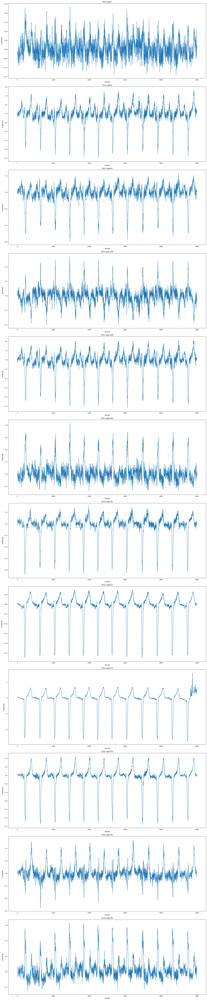

In [14]:
# lets visualize one of the ECGs

# Number of leads
num_leads = raw_sample.shape[2]

# Create a figure with subplots
plt.figure(figsize=(20, 8 * num_leads))

# Lead labels in the standard order
lead_labels = ['I', 'II', 'III', 'aVF', 'aVR', 'aVL', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']           # Lead order

# Plot each lead separately
for i in range(num_leads):
    plt.subplot(num_leads, 1, i + 1)
    plt.plot(raw_sample[0][:, i])                                                                            # Plot the i-th lead
    plt.title(f'ECG Lead {lead_labels[i]}')
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()


In [ ]:
MORTALITY ANALYSIS

We will start with the first outcome, mortality.
For this analysis, we will use the data from the last hospitalization of the patients that died.
We will calculate eachs patients heart age at the time of their last hospitalization, and then use
this data to see the correlastion of this age with the outcome.

We will do this with the following steps:

1. Preprocessing the ECG data
2. Importing the model 
3. Calculating the heart age for each patient
4. Visualizing the data
5. Calculating the heart age gap
6. Calculating the correlation between the heart age gap and the outcome

In [ ]:
to preprocess and clean the ecg signals, we will use the following functions:
    1. resample_ecg: to resample the ecg signals
    2. filter_ecg: to filter the ecg signals
    3. normalize_ecg: to normalize the ecg signals

In [9]:
# As you can see, the ECG data is noisy and contains a lot of artifacts.
# We will preprocess the data to remove the noise and artifacts.

''' 
We also need the model input to be shape = (N, 12, 4096), N being the number of samples,
12 the number of leads, and 4096 the points of the ECG tracings sampled at 400Hz .
Segmentation is NOT needed, as all the ecgs are already 10 seconds long.
'''

# Preprocess the ECG data

# 1. Downsampling 

def resample_ecg(ecg_signal, new_length=4096):
    '''
    Resample the ECG signal to the specified length.
    
   Parameters: 
            ecg_signal: The ECG signal to resample
            new_length: The new length of the ECG signal
    Returns: The resampled ECG signal 
    '''

    return signal.resample(ecg_signal, new_length, axis=1)

# 2. Noise removal

def bandpass(ecg_signal, lowcut=0.5, highcut=40, fs=500, order=10):
    '''
    Apply a bandpass FIR filter to remove noise from the ECG signal using a windowed design.
    
    Parameters:
    ecg_signal (numpy array): The noisy ECG signal.
    lowcut (float): The low frequency cut-off for the bandpass filter (in Hz).
    highcut (float): The high frequency cut-off for the bandpass filter (in Hz).
    fs (int): The sampling frequency (Hz).
    order (int): The order of the filter (number of taps).

    Returns:
    numpy array: The filtered ECG signal.
    '''
    nyq = 0.5 * fs  # Nyquist frequency
    low = lowcut / nyq
    high = highcut / nyq
    
     # Design FIR bandpass filter using firwin
    taps = signal.firwin(order + 1, [low, high], pass_zero=False, fs=fs)
    
    # Apply the filter with custom padlen
    filtered_signal = signal.filtfilt(taps, 1.0, ecg_signal, padlen=100, axis=1)
    
    return filtered_signal


# 3. Normalization

def normalize_ecg(ecg_signal):
    '''
    Normalize each sample independently using z-score normalization.
    
    Parameters:
    ecg_signal (numpy array): Input ECG signal (shape: samples, timepoints, leads).
    
    Returns:
    numpy array: Z-score normalized ECG signal (same shape as input).
    '''
    # Calculate mean and std for each sample across timepoints and leads (axis 1 and 2)
    mean_val = np.mean(ecg_signal, axis=(1, 2), keepdims=True)
    std_val = np.std(ecg_signal, axis=(1, 2), keepdims=True)
    
    # Prevent division by zero in case std_val is zero
    std_val[std_val == 0] = 1
    
    # Apply z-score normalization independently for each sample
    ecg_signal_norm = (ecg_signal - mean_val) / std_val
    
    return ecg_signal_norm


In [5]:
#Resample the ECG signals
resampled_mortality = resample_ecg(raw_mortality, new_length=4096)

# Apply bandpass filter to the reshaped ECG
filtered_mortality = bandpass(resampled_mortality, lowcut=0.1, highcut=40, fs=400)


In [10]:
# Apply the normalization to the filtered ECG
normalized_mortality = normalize_ecg(filtered_mortality)

In [19]:
# Change the type to a tensor
mortality_input = normalized_mortality.astype(np.float32)
normalized_mortality.shape

(17898, 4096, 12)

In [22]:
# Lets plot the raw and filtered ECG signals for the first patient in the mortality analysis dataset

# Number of leads
num_leads = normalized_mortality[5].shape[1]

# Create a figure with subplots: 2 rows for each lead (raw and filtered)
plt.figure(figsize=(100, 16 * num_leads))

# Lead labels in the standard order
lead_labels = ['I', 'II', 'III', 'aVF', 'aVR', 'aVL', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']

# Plot each lead separately (raw and filtered)
for i in range(num_leads):
    # Plot raw ECG lead
    plt.subplot(num_leads, 2, 2*i + 1)
    plt.plot(raw_sample[0][:, i])  # Plot the raw ECG for the i-th lead
    plt.title(f'Raw ECG Lead {lead_labels[i]}')
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')

    # Plot filtered ECG lead
    plt.subplot(num_leads, 2, 2*i + 2)
    plt.plot(normalized_mortality[5][:, i])  # Plot the filtered ECG for the i-th lead
    plt.title(f'Filtered ECG Lead {lead_labels[i]}')
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()


In [20]:
# ResNet model for age prediction
'''
I did not import it from the script so I could show the code here. I modified the original by 
deleting tha parser and the arguments.

'''

def evaluate(mdl, traces, batch_size=8, output='predicted_age.csv', ids_dset=None):
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    
    # Load the model checkpoint
    ckpt = torch.load(os.path.join(mdl, 'model.pth'), map_location=lambda storage, loc: storage)
    
    # Load the model configuration
    config_path = os.path.join(mdl, 'config.json')  # Avoid conflict with json module
    with open(config_path, 'r') as f:
        config_dict = json.load(f)
    
    # Create the ResNet1d model instance
    N_LEADS = 12
    model = ResNet1d(
        input_dim=(N_LEADS, config_dict['seq_length']),
        blocks_dim=list(zip(config_dict['net_filter_size'], config_dict['net_seq_lengh'])),
        n_classes=1,
        kernel_size=config_dict['kernel_size'],
        dropout_rate=config_dict['dropout_rate']
    )
    
    # Load model weights
    model.load_state_dict(ckpt["model"])
    model = model.to(device)
    
    # Use the traces directly as passed into the function
    n_total = len(traces)
    
    # Load the IDs if they exist
    if ids_dset:
        ids = ids_dset
    else:
        ids = range(n_total)
    
    # Initialize predicted ages array
    predicted_age = np.zeros((n_total,))
    
    # Set the model to evaluation mode
    model.eval()
    n_batches = int(np.ceil(n_total / batch_size))
    
    # Evaluate the model
    end = 0
    for i in tqdm.tqdm(range(n_batches)):
        start = end
        end = min((i + 1) * batch_size, n_total)
        with torch.no_grad():
            x = torch.tensor(traces[start:end, :, :]).transpose(-1, -2)
            x = x.to(device, dtype=torch.float32)
            y_pred = model(x)
        predicted_age[start:end] = y_pred.detach().cpu().numpy().flatten()
    
    # Save the predictions to a CSV file
    df = pd.DataFrame({'ids': ids, 'predicted_age': predicted_age})
    df = df.set_index('ids')
    df.to_csv(output)

path_to_model = "C:\\Users\\Vero Ramirez\\Desktop\\CODE\\CODE\\model_ecg\\"

In [21]:
# Lets evaluate the model with the reshaped ecg data

#Lets set the evaluation mode
evaluate(path_to_model, mortality_input, batch_size=8, output='predicted_age.csv', ids_dset=None)

C:\Users\Vero Ramirez\AppData\Local\Temp\ipykernel_448\2735156044.py:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(os.path.join(mdl, 'model.pth'), map_

In [38]:
# Finally, I will merge the predictions with the mortality analysis data

# Load the predicted age data 
predicted_age = pd.read_csv('predicted_age.csv')

# Merge the predicted age data with the mortality data
mortality_analysis['predicted_age'] = predicted_age['predicted_age'].values


In [32]:
mortality_analysis.head()

,subject_id_x,hadm_id,admittime,dischtime,admission_type,admission_location,race,gender,anchor_year_group,anchor_year,anchor_age,dod,study_id,file_name,ecg_time,path,length_of_stay_(days),subject_id_y,icd_code,icd_version,seq_num,long_title,age,predicted_age
0,10000980,20897796,2193-08-15 01:01:00,2193-08-17 15:07:00,OBSERVATION ADMIT,WALK-IN/SELF REFERRAL,BLACK/AFRICAN AMERICAN,F,2008 - 2010,2186,73,2193-08-26,48132909.0,48132909.0,2193-08-15 10:45:00,files/p1000/p10000980/s48132909/48132909,2,10000980.0,I5033,10.0,2.0,Acute on chronic diastolic (congestive) heart ...,80,57.418945
1,10001843,21728396,2131-11-09 16:05:00,2131-11-11 11:23:00,OBSERVATION ADMIT,TRANSFER FROM HOSPITAL,WHITE,M,2017 - 2019,2131,73,NaN,43647002.0,43647002.0,2131-11-10 09:04:00,files/p1000/p10001843/s43647002/43647002,1,10001843.0,I5031,10.0,2.0,Acute diastolic (congestive) heart failure,73,57.754532
2,10001877,21320596,2150-11-21 23:02:00,2150-11-23 16:46:00,EU OBSERVATION,EMERGENCY ROOM,WHITE,M,2008 - 2010,2149,89,NaN,42315368.0,42315368.0,2150-11-21 23:10:00,files/p1000/p10001877/s42315368/42315368,1,10001877.0,42833,9.0,1.0,Acute on chronic diastolic heart failure,90,67.451126
3,10002013,21763296,2165-11-23 08:19:00,2165-11-26 15:40:00,DIRECT EMER.,CLINIC REFERRAL,WHITE,F,2008 - 2010,2156,53,NaN,47158381.0,47158381.0,2165-11-23 10:23:00,files/p1000/p10002013/s47158381/47158381,3,10002013.0,I5032,10.0,6.0,Chronic diastolic (congestive) heart failure,62,54.038101
4,10002131,24065018,2128-03-17 14:53:00,2128-03-19 16:25:00,EW EMER.,EMERGENCY ROOM,WHITE,F,2011 - 2013,2123,87,2128-03-21,49320902.0,49320902.0,2128-03-17 16:56:00,files/p1000/p10002131/s49320902/49320902,2,10002131.0,I5033,10.0,2.0,Acute on chronic diastolic (congestive) heart ...,92,80.295738


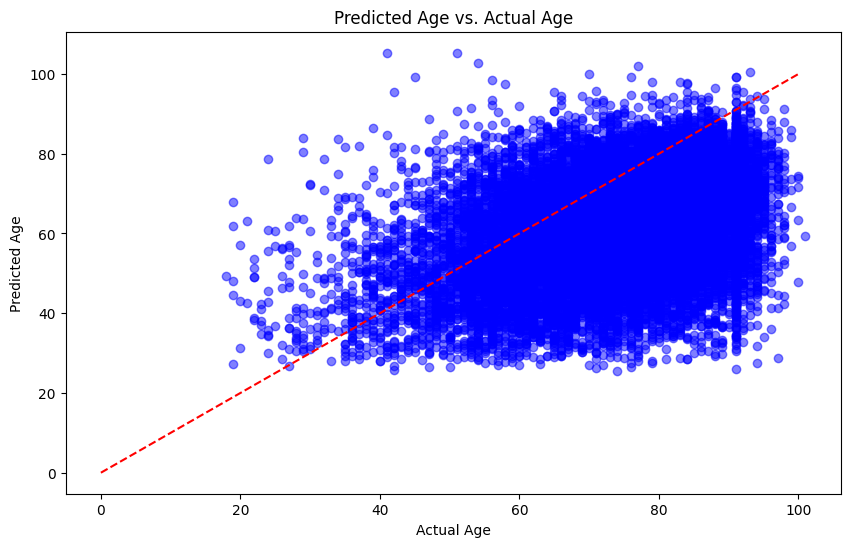

In [33]:
# Lets make a scatter plot of the predicted age vs the actual age

plt.figure(figsize=(10, 6))
plt.scatter(mortality_analysis['age'], mortality_analysis['predicted_age'], color='blue', alpha=0.5)
plt.plot([0, 100], [0, 100], color='red', linestyle='--')
plt.title('Predicted Age vs. Actual Age')
plt.xlabel('Actual Age')
plt.ylabel('Predicted Age')
plt.show()

In [39]:
# lets separate the data in three groups, normal, advanced and decelerated heart age 

''' 
Advanced heart age: The heart age gap is > 8.38  (the mean standard error of the model) 
Normal heart age: The heart age gap is between -8.38 and 8.38
Decelerated heart age: The heart age gap is < -8.38
'''

mortality_analysis['heart_age_gap'] = mortality_analysis['predicted_age'] - \
    mortality_analysis['age']

# Create a new column to categorize the heart age gap

def categorize_heart_age_gap(row):
    if row['heart_age_gap'] > 8.38:
        return 'Advanced'
    elif row['heart_age_gap'] < -8.38:
        return 'Decelerated'
    else:
        return 'Normal'

# Apply the function to the DataFrame
mortality_analysis['heart_age_category'] = mortality_analysis.\
    apply(categorize_heart_age_gap, axis=1)

#Lets calculate the time to event for the patients that died

mortality_analysis['dod'] = mortality_analysis['dod'].astype('datetime64[ns]')
mortality_analysis['admittime'] = mortality_analysis['admittime'].astype('datetime64[ns]')

mortality_analysis['time_to_event'] = (mortality_analysis['dod'] - \
    mortality_analysis['admittime']).dt.days

# Lets censor the patients that are still alive or that died after 365 days of their last 
# hospitalization

mortality_analysis['event_indicator'] = np.where(
    mortality_analysis['dod'].isna() | (mortality_analysis['time_to_event'] > 365), 
    0,  # Still alive or died after 365 days (censored)
    1   # Died within 365 days
)

# Replace all the NaN values in the 'time_to_event' column with 365
mortality_analysis['time_to_event'] = mortality_analysis['time_to_event'].fillna(400)


mortality_analysis.head()

,subject_id_x,hadm_id,admittime,dischtime,admission_type,admission_location,race,gender,anchor_year_group,anchor_year,anchor_age,dod,study_id,file_name,ecg_time,path,length_of_stay_(days),subject_id_y,icd_code,icd_version,seq_num,long_title,age,predicted_age,heart_age_gap,heart_age_category,time_to_event,event_indicator
0,10000980,20897796,2193-08-15 01:01:00,2193-08-17 15:07:00,OBSERVATION ADMIT,WALK-IN/SELF REFERRAL,BLACK/AFRICAN AMERICAN,F,2008 - 2010,2186,73,2193-08-26,48132909.0,48132909.0,2193-08-15 10:45:00,files/p1000/p10000980/s48132909/48132909,2,10000980.0,I5033,10.0,2.0,Acute on chronic diastolic (congestive) heart ...,80,57.418945,-22.581055,Decelerated,10.0,1
1,10001843,21728396,2131-11-09 16:05:00,2131-11-11 11:23:00,OBSERVATION ADMIT,TRANSFER FROM HOSPITAL,WHITE,M,2017 - 2019,2131,73,NaT,43647002.0,43647002.0,2131-11-10 09:04:00,files/p1000/p10001843/s43647002/43647002,1,10001843.0,I5031,10.0,2.0,Acute diastolic (congestive) heart failure,73,57.754532,-15.245468,Decelerated,400.0,0
2,10001877,21320596,2150-11-21 23:02:00,2150-11-23 16:46:00,EU OBSERVATION,EMERGENCY ROOM,WHITE,M,2008 - 2010,2149,89,NaT,42315368.0,42315368.0,2150-11-21 23:10:00,files/p1000/p10001877/s42315368/42315368,1,10001877.0,42833,9.0,1.0,Acute on chronic diastolic heart failure,90,67.451126,-22.548874,Decelerated,400.0,0
3,10002013,21763296,2165-11-23 08:19:00,2165-11-26 15:40:00,DIRECT EMER.,CLINIC REFERRAL,WHITE,F,2008 - 2010,2156,53,NaT,47158381.0,47158381.0,2165-11-23 10:23:00,files/p1000/p10002013/s47158381/47158381,3,10002013.0,I5032,10.0,6.0,Chronic diastolic (congestive) heart failure,62,54.038101,-7.961899,Normal,400.0,0
4,10002131,24065018,2128-03-17 14:53:00,2128-03-19 16:25:00,EW EMER.,EMERGENCY ROOM,WHITE,F,2011 - 2013,2123,87,2128-03-21,49320902.0,49320902.0,2128-03-17 16:56:00,files/p1000/p10002131/s49320902/49320902,2,10002131.0,I5033,10.0,2.0,Acute on chronic diastolic (congestive) heart ...,92,80.295738,-11.704262,Decelerated,3.0,1


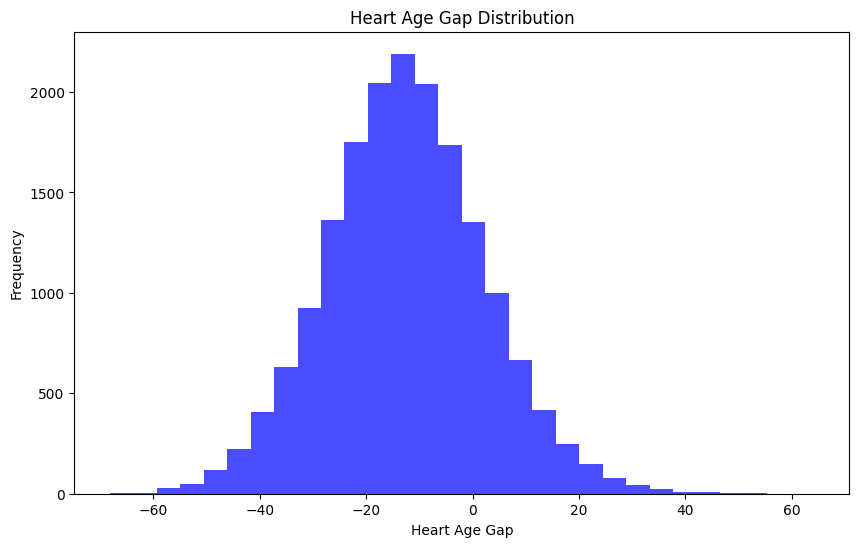

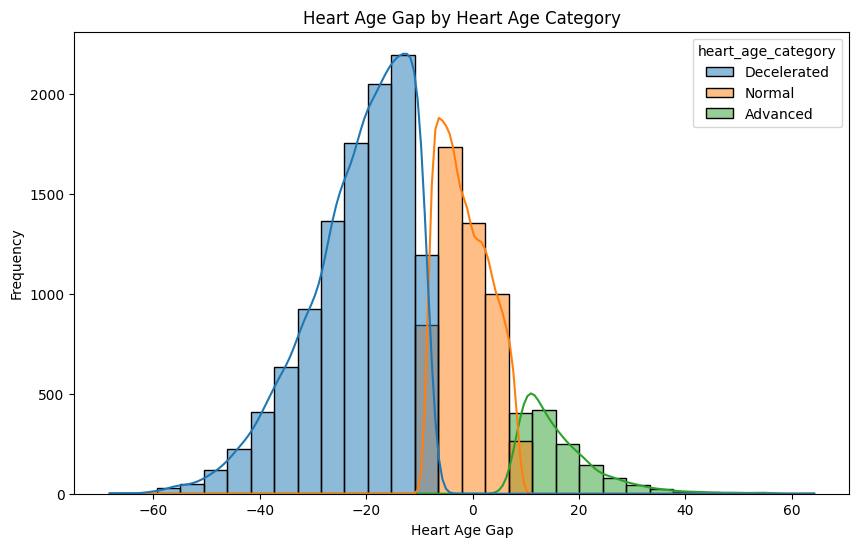

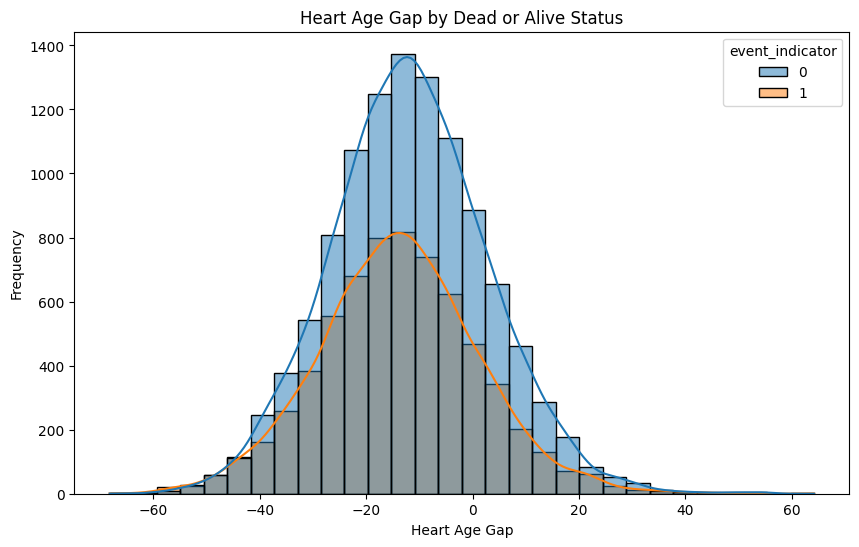

In [50]:
# Plot a histogram of the heart age gap

plt.figure(figsize=(10, 6))
plt.hist(mortality_analysis['heart_age_gap'], bins=30, color='blue', alpha=0.7)
plt.title('Heart Age Gap Distribution')
plt.xlabel('Heart Age Gap')
plt.ylabel('Frequency')
plt.show()

# subplot of the heart age gap by the heart age category

plt.figure(figsize=(10, 6))
sns.histplot(data=mortality_analysis, x='heart_age_gap', hue='heart_age_category', bins=30, kde=True)
plt.title('Heart Age Gap by Heart Age Category')
plt.xlabel('Heart Age Gap')
plt.ylabel('Frequency')
plt.show()

# subplot of the heart age gap by the dead or alive status

plt.figure(figsize=(10, 6))
sns.histplot(data=mortality_analysis, x='heart_age_gap', hue='event_indicator', bins=30, kde=True)
plt.title('Heart Age Gap by Dead or Alive Status')
plt.xlabel('Heart Age Gap')
plt.ylabel('Frequency')
plt.show()


In [ ]:
#the distribution of the heart age gap is not normal, so we will use the Spearman correlation
# coefficient instead of the Pearson correlation coefficient.

In [60]:
# Perform a Shapiro-Wilk test to check for normality of the heart age gap

stat, p = shapiro(mortality_analysis['heart_age_gap'])
print(f'Statistics={stat}, p={p}')
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')
    
# Lets calculate the correlation between the heart age gap and the event indicator using the Spearman

correlation = mortality_analysis[['heart_age_gap', 'event_indicator']].corr(method='spearman')
print( f'The Spearman correlation coefficient between the heart age gap and the event indicator \
is: {correlation["event_indicator"]["heart_age_gap"]}')

Statistics=0.9978522896756048, p=5.546747072926624e-15
Sample does not look Gaussian (reject H0)
The Spearman correlation coefficient between the heart age gap and the event indicator is: -0.06370675422792937


c:\Users\Vero Ramirez\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 17521.
  res = hypotest_fun_out(*samples, **kwds)


In [58]:

# Also, because the data is non parametric Lets perform a Mann-Whitney U test to compare the heart 
# age gap between the dead and alive subjects

# Get the heart age gap for dead and alive patients
heart_age_gap_dead = mortality_analysis[mortality_analysis['event_indicator'] == 1]['heart_age_gap']
heart_age_gap_alive = mortality_analysis[mortality_analysis['event_indicator'] == 0]['heart_age_gap']

# Perform the Mann-Whitney U test and interpret the results

stat, p = mannwhitneyu(heart_age_gap_dead, heart_age_gap_alive)
print(f'Statistics={stat}, p={p}')
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')
    
# This means that the heart age gap is significantly different between the dead and alive patients


Statistics=33230337.5, p=3.3857684987769994e-17
Different distribution (reject H0)


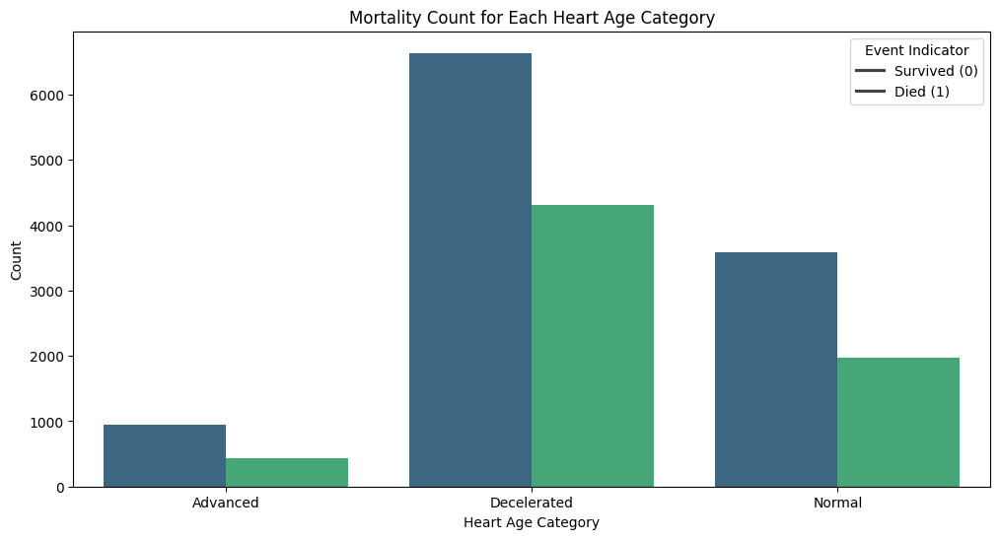

In [43]:
# Aggregate data: Count occurrences of each event_indicator within each heart_age_category
count_data = mortality_analysis.groupby(['heart_age_category', 'event_indicator']).size().reset_index(name='count')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(data=count_data, x='heart_age_category', y='count', hue='event_indicator', palette='viridis')
plt.title('Mortality Count for Each Heart Age Category')
plt.xlabel('Heart Age Category')
plt.ylabel('Count')
plt.legend(title='Event Indicator', labels=['Survived (0)', 'Died (1)'])
plt.show()

Decelerated:
Restricted Mean Survival Time (up to 365 days): 254.8900566624017
Normal:
Restricted Mean Survival Time (up to 365 days): 266.5749759384023
Advanced:
Restricted Mean Survival Time (up to 365 days): 276.2015895953758


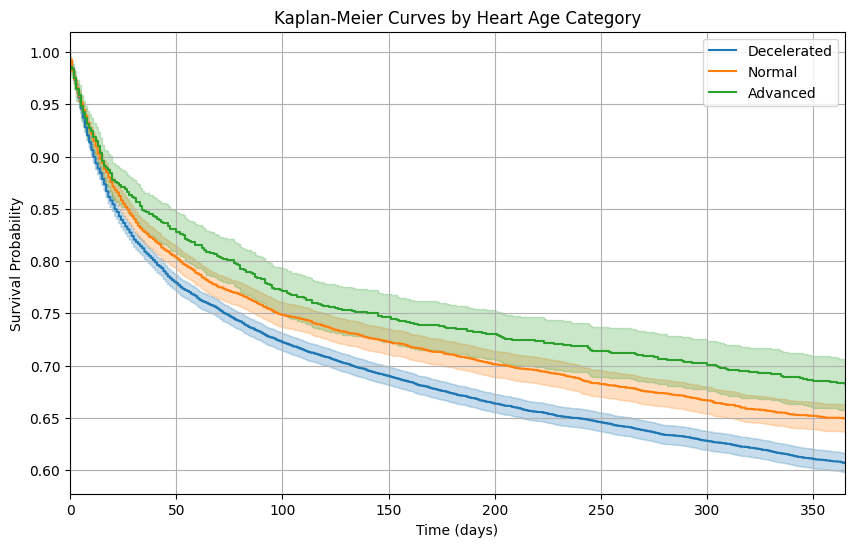

In [44]:

# Drop patients with missing heart age gap data

mortality_analysis = mortality_analysis.dropna(subset=['heart_age_gap'])

# Create Kaplan-Meier fitter objects for each age group
age_groups = mortality_analysis["heart_age_category"].unique()
kmf_results = {}

for age_group in age_groups:
    subset = mortality_analysis[mortality_analysis["heart_age_category"] == age_group]
    
    # Initialize KaplanMeierFitter
    kmf = KaplanMeierFitter()
    
    # Fit the Kaplan-Meier model
    kmf.fit(durations=subset["time_to_event"], event_observed=subset["event_indicator"], label=age_group)
    
    # Store the fitted model
    kmf_results[age_group] = kmf
    
    # Calculate restricted mean survival time up to a specific time point (e.g., 365 days)
    t_max = 365  # You can adjust this time point as needed
    restricted_mean = restricted_mean_survival_time(kmf, t=t_max)
    
    print(f"{age_group}:")
    print(f"Restricted Mean Survival Time (up to {t_max} days): {restricted_mean}")

# Plot the Kaplan-Meier curves
plt.figure(figsize=(10, 6))
for age_group, kmf in kmf_results.items():
    kmf.plot(label=age_group)

plt.xlim(0, 365)

plt.xlabel("Time (days)")
plt.ylabel("Survival Probability")
plt.title("Kaplan-Meier Curves by Heart Age Category")
plt.grid(True)
plt.legend()
plt.show()

   Advanced  Decelerated
0         0            1
1         0            1
2         0            1
3         0            0
4         0            1


<lifelines.CoxPHFitter: fitted with 17521 total observations, 10956 right-censored observations>
             duration col = 'time_to_event'
                event col = 'event_indicator'
      baseline estimation = breslow
   number of observations = 17521
number of events observed = 6565
   partial log-likelihood = -62703.10
         time fit was run = 2024-09-22 17:49:07 UTC

---
             coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                    
Advanced    -0.12      0.89      0.05           -0.22           -0.01                0.80                0.99
Decelerated  0.14      1.15      0.03            0.09            0.20                1.09                1.22

             cmp to     z      p  -log2(p)
covariate                                 
Advanced       0.00 -2.24   0.03      5.32
Decelerated    0.00  5.13 <0.005     21.71
---
Concordance = 0.52
Partial AIC = 125410.20
log-likelihood ratio test = 47.51 on 2 df
-log2(p) of ll-ratio test = 34.27

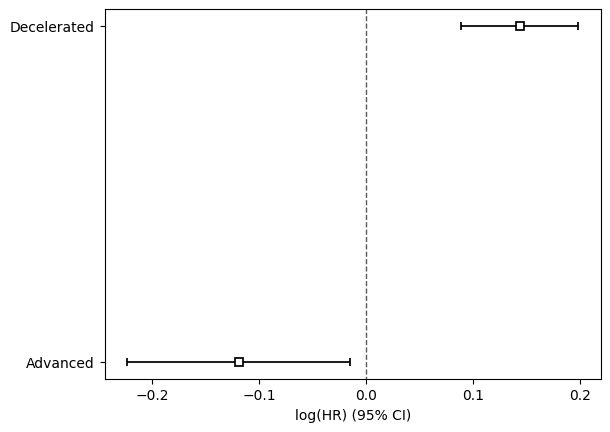

In [45]:

# Cox proportional hazards analysis

''' 
Because we have 3 different categories for the heart age gap, we will need to use some dummy code 
for the Cox model
'''

dummies_age = pd.get_dummies(mortality_analysis['heart_age_category'])
#drop the normal column
dummies_age = dummies_age.drop('Normal', axis=1)

#Convert true to 1 and false to 0
dummies_age['Advanced'] = dummies_age['Advanced'].apply(lambda x: 1 if x == True else 0)
dummies_age['Decelerated'] = dummies_age['Decelerated'].apply(lambda x: 1 if x == True else 0)
print(dummies_age.head())

# Merge the dummy columns with the original DataFrame
mortality_analysis = pd.concat([mortality_analysis, dummies_age], axis=1)

# The dataset should include time_to_event, event_indicator, and other covariates like heart_age_category
cph = CoxPHFitter()

# Fit the Cox model using relevant columns
cph.fit(mortality_analysis, duration_col="time_to_event", event_col="event_indicator", formula = 'Advanced + Decelerated')

# Print the summary to see hazard ratios and p-values
cph.print_summary()

# Plot the survival function based on the Cox model
cph.plot()
plt.show()

In [46]:
# lets check the proportional hazards assumption

cph.check_assumptions(mortality_analysis, p_value_threshold=0.05)

Proportional hazard assumption looks okay.


[]

In [59]:
# Save the relevant data to a csv file for stratified analysis

path_stratified = r'C:\Users\Vero Ramirez\Desktop\CODE\CODE\mortality_stratified.csv'
mortality_analysis.to_csv(path_stratified)

# Conclusions and analysis <a name='conclusions'></a>

- The MIMIC database contains a significant number of sequential ECGs recorded at various times of an individuals life.
- There are 6,400 patients with ECGs showing a time gap of more than one year between recordings.
- Aging profiles could be analyzed for patients, especially those diagnosed with heart failure. While this analysis won't establish causation between the chronic disease and aging, it can provide insights into how heart failure impacts biological age, as estimated using deep learning techniques.

Possible Plan Modification:

- We could analyze the heart profile changes over a one-year period for patients diagnosed with heart failure and compare these changes to a three-year mortality rate. Although we cannot establish causality due to the lack of information on other exposures between hospitalizations, this approach could offer insights into how heart aging progresses in this population. Additionally, it might reveal whether a greater difference in aging profiles is associated with mortality among hospitalized patients.

# References <a name='references'></a>
1. Johnson, Alistair, et al. "MIMIC-IV: A freely accessible electronic health record dataset." Schnpj (2021): 36596836. PubMed MIMIC-IV v2.2. PhysioNet
1. Johnson, A., Bulgarelli, L., Pollard, T., Horng, S., Celi, L. A., & Mark, R. (2023). MIMIC-IV (version 2.2). PhysioNet. https://doi.org/10.13026/6mm1-ek67.
1. Gow, B., Pollard, T., Nathanson, L. A., Johnson, A., Moody, B., Fernandes, C., Greenbaum, N., Waks, J. W., Eslami, P., Carbonati, T., Chaudhari, A., Herbst, E., Moukheiber, D., Berkowitz, S., Mark, R., & Horng, S. (2023). MIMIC-IV-ECG: Diagnostic Electrocardiogram Matched Subset (version 1.0). PhysioNet. https://doi.org/10.13026/4nqg-sb35.
1. Fan J, Li X, Yu X, Liu Z, Jiang Y, Fang Y, et al. Global Burden, Risk Factor Analysis, and Prediction Study of Ischemic Stroke, 1990–2030. Neurology [Internet]. 2023 Jul 11 [cited 2024 Jun 30];101(2). Available from: https://www.neurology.org/doi/10.1212/WNL.0000000000207387
1. Yang X, Gong Y, Waheed N, March K, Bian J, Hogan WR, et al. Identifying Cancer Patients at Risk for Heart Failure Using Machine Learning Methods. AMIA Annu Symp Proc. 2019;2019:933-41.